In [1]:
#importing necessary functions
from pyspark.sql import SparkSession
from pyspark.sql.functions import split, col, substring, when, concat, lit
spark = SparkSession.builder \
    .master("local[*]") \
    .appName("Learning_Spark") \
    .getOrCreate()
import pandas as pd
import geopandas as gpd
import osmnx as ox
import contextily as cx
import sklearn
from sklearn import cluster
from sklearn.cluster import KMeans
import numpy
import shapely
import matplotlib.pyplot as plt
import statistics
from statistics import mode
import json
import os
import pickle
from datetime import timedelta
from math import floor, ceil
import fiona
from pyproj import Proj
from shapely import geometry
from scipy.stats import poisson
from random import randint, uniform
from datetime import datetime
from operator import itemgetter
from copy import deepcopy
import csv
# import from the codebase
#from extract_regions import get_special_cells, special_time_checker

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


22/07/20 10:55:54 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [2]:
#finding the closest center to each point
def find_closest_center(centers, x, y):
    closest_center = -1
    cc_dist = 10000
    for i in range(len(centers)):
        dist = (centers[i][0]-x)**2 + (centers[i][1]-y)**2
        if dist<cc_dist:
            closest_center = i
            cc_dist = dist
    return closest_center

In [3]:
#finding which cluster contains the largest number of points in a given cell
def cell_voting(cell_points):
    if len(cell_points) == 0:
        return -1
    return(mode(cell_points))
            

In [4]:
def load_fire_stations(city):
    national_fire = gpd.read_file("/Users/hunter7lee/Downloads/Fire_Stations.geojson")
    local_fire = national_fire[national_fire["CITY"] == city]
    lon_array_temp = local_fire['geometry'].x.to_numpy()
    lat_array_temp = local_fire['geometry'].y.to_numpy()
    local_array = numpy.vstack((lon_array_temp, lat_array_temp)).T
    local_list = local_array.tolist()
    with open("/Users/hunter7lee/Desktop/ISIS/fireStationsSEA.json", 'w') as f:
        json.dump(local_list, f, indent=2)
    with open("/Users/hunter7lee/Desktop/ISIS/fireStationsSEA.csv", 'w') as csvfile: 
        csvwriter = csv.writer(csvfile)
        csvwriter.writerow(["longitude", "latitude"])
        csvwriter.writerows(local_array)
    

In [5]:
load_fire_stations("Seattle")

In [6]:
#reading data from the created file
data = gpd.read_file("/Users/hunter7lee/Desktop/ISIS/SeattleData192021.geojson")

In [7]:
#creating the array of points from the data set
lon_array = data['lon'].to_numpy()
lat_array = data['lat'].to_numpy()
point_array = numpy.vstack((lon_array, lat_array)).T

In [8]:
#doing kmeans with n_clusters clusters
kmeans = KMeans(n_clusters=8, random_state=0)
clusters = kmeans.fit_predict(point_array)
#defining the labels and the cluster centers
labels = kmeans.labels_
centers = kmeans.cluster_centers_
#creating the bounds of the data
xmin, ymin, xmax, ymax= data.total_bounds

In [9]:
#distance from xmin to xmax is approximately 8.7 miles, looking for one mile cells
length_cells=8.7
cell_size = (xmax-xmin)/length_cells
# projection of the grid
crs = "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"
grid_cells = []
for x0 in numpy.arange(xmin, xmax+cell_size, cell_size ):
    for y0 in numpy.arange(ymin, ymax+cell_size, cell_size):
        # bounds
        x1 = x0-cell_size
        y1 = y0+cell_size
        grid_cells.append( shapely.geometry.box(x0, y0, x1, y1)  )
cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'], 
                                 crs=crs)
# adapted from https://james-brennan.github.io/posts/fast_gridding_geopandas/

In [10]:
#creating a dictionary that relates an integer to each of the cells
cell_dict = {}
i=0
for c in grid_cells:
    cell_dict[i] = c
    i += 1

In [11]:
print(cell_dict)

{0: <shapely.geometry.polygon.Polygon object at 0x17504be50>, 1: <shapely.geometry.polygon.Polygon object at 0x1750ac550>, 2: <shapely.geometry.polygon.Polygon object at 0x1750ac610>, 3: <shapely.geometry.polygon.Polygon object at 0x1750ac670>, 4: <shapely.geometry.polygon.Polygon object at 0x1750ac6d0>, 5: <shapely.geometry.polygon.Polygon object at 0x1750ac730>, 6: <shapely.geometry.polygon.Polygon object at 0x1750ad390>, 7: <shapely.geometry.polygon.Polygon object at 0x1750ad3f0>, 8: <shapely.geometry.polygon.Polygon object at 0x1750ad450>, 9: <shapely.geometry.polygon.Polygon object at 0x17504b0d0>, 10: <shapely.geometry.polygon.Polygon object at 0x17286f490>, 11: <shapely.geometry.polygon.Polygon object at 0x17bf37010>, 12: <shapely.geometry.polygon.Polygon object at 0x1750ac4f0>, 13: <shapely.geometry.polygon.Polygon object at 0x1750ad4e0>, 14: <shapely.geometry.polygon.Polygon object at 0x1750ad540>, 15: <shapely.geometry.polygon.Polygon object at 0x1750ad5a0>, 16: <shapely.geom

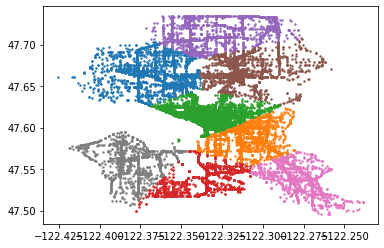

In [12]:
#fit_predict allows us to print the clustered data
label = kmeans.fit_predict(point_array)
u_labels = numpy.unique(label)
for i in u_labels:
    plt.scatter(point_array[label==i, 0], point_array[label==i, 1], label = i, s = 2)
ax = plt
#transposing so centers[0] and centers[1] call the x and y coordinates
centers = centers.T

(-122.43463330967757,
 -122.22963110917993,
 47.48408176206495,
 47.74604918521363)

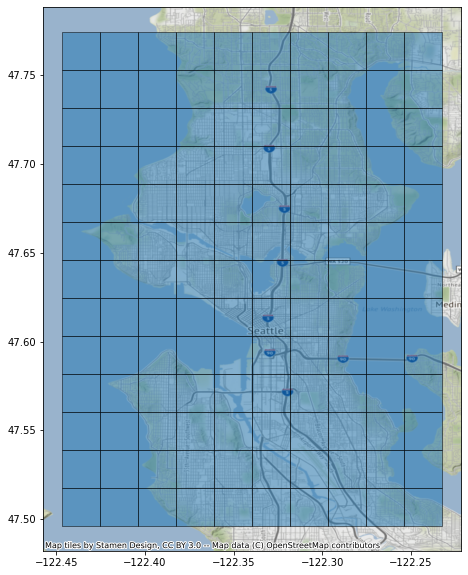

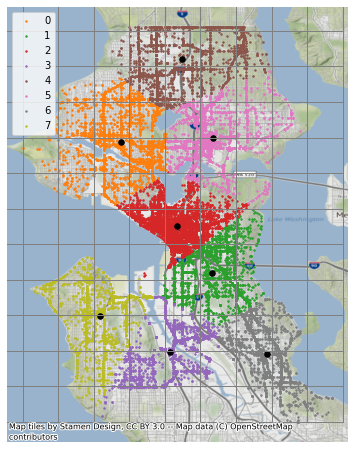

In [13]:
#creating the background map
df_wm = cell.set_crs(crs='EPSG:4326', allow_override=True)
ax = df_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')
cx.add_basemap(ax, crs=df_wm.crs.to_string())
ax = data.plot(markersize=.1, figsize=(12, 8))
#creating a scatter plot of the data points
for i in u_labels:
    plt.scatter(point_array[label==i, 0], point_array[label==i, 1], label = i, s = 2)
#adding the cluster centers
plt.scatter(centers[0], centers[1], s = 30, c="black")
plt.autoscale(False)
plt.legend()
#plotting the data points and cluster centers
cell.plot(ax=ax, facecolor="none", edgecolor='grey')
cx.add_basemap(ax, crs=df_wm.crs.to_string())
ax.axis("off")

In [14]:
#creating a list of lists, where the exterior list has a list of cells, and the interior list
#has a list of every point in each cell
point_array = point_array.T
gdf = gpd.GeoDataFrame(geometry=gpd.points_from_xy(point_array[0], point_array[1]))
points = gpd.GeoSeries(gpd.points_from_xy(point_array[0], point_array[1]), crs='EPSG:4326')
counter = 0
all_cells = []
print(centers)
centers = centers.T
for c in grid_cells:
    cellab = []
    i=0
    for p in points:
        if c.contains(p):
            cellab.append(find_closest_center(centers, p.x, p.y))
            
    all_cells.append(cellab)
    

[[-122.36636891 -122.31113697 -122.33232661 -122.33652151 -122.32937662
  -122.31087301 -122.27840883 -122.37888797]
 [  47.66486664   47.5858218    47.61402536   47.53834418   47.71449232
    47.66715853   47.53697302   47.55975754]]


In [15]:
#doing the cell voting, creating a list of num_celss length where each value is the cluster that cell belongs to
cell_values = []
num_cells_incident = 0
total_incidents = 0
for c in all_cells:
    total_incidents += len(c)
    print(c)
    x = cell_voting(c)
    cell_values.append(x)
    if x!= -1:
        num_cells_incident += 1
        
cell_values_dict = {}
for i in range(len(cell_values)):
    cell_values_dict[i] = cell_values[i]
    
with open("/Users/hunter7lee/Desktop/Seattle/1x1/eightClusters/kMeansClusters.pkl", 'wb') as f:
    pickle.dump((cell_values_dict, kmeans), f)

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7]
[7, 7]
[]
[0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[]
[]
[]
[]
[7, 7, 7, 7, 7, 7, 7, 7, 7]
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7]
[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,

In [16]:
print(cell_values_dict)

{0: -1, 1: -1, 2: -1, 3: -1, 4: -1, 5: -1, 6: -1, 7: -1, 8: -1, 9: -1, 10: -1, 11: -1, 12: -1, 13: -1, 14: -1, 15: -1, 16: 7, 17: 7, 18: -1, 19: 0, 20: 0, 21: 0, 22: -1, 23: -1, 24: -1, 25: -1, 26: 7, 27: 7, 28: 7, 29: 7, 30: 7, 31: -1, 32: 0, 33: 0, 34: 0, 35: 0, 36: -1, 37: -1, 38: -1, 39: 3, 40: 7, 41: 7, 42: 7, 43: 7, 44: 2, 45: 0, 46: 0, 47: 0, 48: 0, 49: 4, 50: 4, 51: -1, 52: 3, 53: 3, 54: 3, 55: 7, 56: 2, 57: 2, 58: 2, 59: 0, 60: 0, 61: 4, 62: 4, 63: 4, 64: -1, 65: -1, 66: 3, 67: 3, 68: 1, 69: 2, 70: 2, 71: 2, 72: 5, 73: 5, 74: 4, 75: 4, 76: 4, 77: -1, 78: -1, 79: 3, 80: 3, 81: 1, 82: 1, 83: 2, 84: 5, 85: 5, 86: 5, 87: 4, 88: 4, 89: 4, 90: -1, 91: 6, 92: 6, 93: 6, 94: 1, 95: 1, 96: 1, 97: 5, 98: 5, 99: 5, 100: 5, 101: 4, 102: 4, 103: -1, 104: 6, 105: 6, 106: 6, 107: 6, 108: -1, 109: -1, 110: -1, 111: 5, 112: 5, 113: 5, 114: -1, 115: -1, 116: -1, 117: 6, 118: -1, 119: -1, 120: -1, 121: -1, 122: -1, 123: -1, 124: -1, 125: -1, 126: -1, 127: -1, 128: -1, 129: -1}


In [17]:
i=1
cell_dict_full = cell_dict.copy()
for key, value in cell_dict_full.items():
    if value == -1:
        del cell_dict[i]
    i+= 1

In [18]:
print(len(cell_dict))

130


In [19]:
valid_cells = list(cell_dict.keys())

In [20]:
cell["kmeanGroup"] = cell_values
num_cells = len(cell_values)

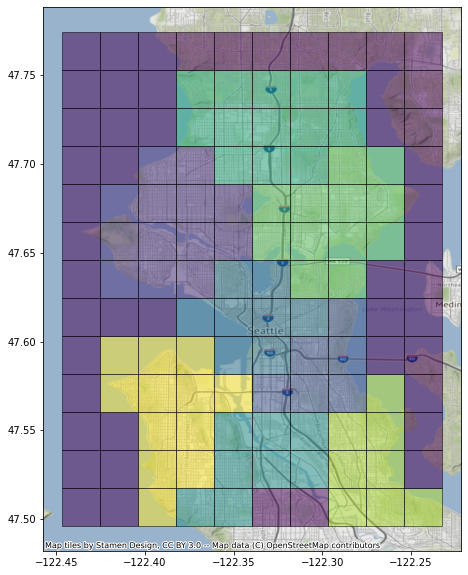

In [21]:
#creating map using the cells
df_wm = cell.set_crs(crs='EPSG:4326', allow_override=True)
ax = df_wm.plot(figsize=(10, 10), alpha=0.5, edgecolor='k', column = "kmeanGroup")
cx.add_basemap(ax, crs=df_wm.crs.to_string())

In [22]:
#printing information
print("Total incidents: " , total_incidents)
print("Total cells: " , num_cells)
print("Total cells with incident: " , num_cells_incident)
print("Range of Data: January 1st, 2019 - December 31st, 2021")


Total incidents:  20193
Total cells:  130
Total cells with incident:  80
Range of Data: January 1st, 2019 - December 31st, 2021


In [23]:
hospitals = gpd.read_file("/Users/hunter7lee/Downloads/Hospitals.geojson")
#data from https://hifld-geoplatform.opendata.arcgis.com/datasets/6ac5e325468c4cb9b905f1728d6fbf0f_0/explore?location=47.607153%2C-122.247132%2C10.93
hospitalsSEA = hospitals[hospitals["CITY"] == "SEATTLE"]

In [24]:
lon_array1 = hospitalsSEA['geometry'].x.to_numpy()
lat_array1 = hospitalsSEA['geometry'].y.to_numpy()
hospital_array = numpy.vstack((lon_array1, lat_array1)).T

In [25]:
duration = 240  # in minutes, the length of each chain
start_time = datetime(2019, 1, 1)
end_time = datetime(2021, 12, 31)
interval = 30  # in minutes

In [26]:
def compare_arrivals(df):
    # number of incidents in each time period
    num_intervals = ceil((end_time - start_time).total_seconds() / (interval * 60))
    num_pred = 0
    chains = os.listdir(os.getcwd() + "/chains")
    for c in chains:
        f_name = "chains/" + c
        f = pickle.load(open(f_name, 'rb'))
        for sample in f:
            for incident in sample:
                num_pred += 1 / 5

    mask = (df['year'] == 2019) & (df['month'] == 1)
    num_pred /= num_intervals
    num_actual = len(df.loc[mask]) / num_intervals
    print("Mean predicted rate : {}".format(num_pred))
    print("Mean actual rate : {}".format(num_actual))
    print("Hello world")

In [27]:
timeab = end_time - start_time
print(timeab.total_seconds())
print(timeab)

94608000.0
1095 days, 0:00:00


In [28]:
rates = {}
#rates in incidents per interval(30 minutes)
timeab = end_time - start_time
seconds = timeab.total_seconds()
num_intervals = seconds / (30*60)
cell_num = 0
for c in all_cells:
    rate = len(c)/num_intervals
    rates.update({cell_num: rate})
    cell_num += 1
print(rates)
    

{0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0015220700152207, 17: 3.805175038051751e-05, 18: 0.0, 19: 9.512937595129375e-05, 20: 0.0003234398782343988, 21: 0.00030441400304414006, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.00017123287671232877, 27: 0.0011986301369863014, 28: 0.0032343987823439876, 29: 0.004204718417047184, 30: 0.0015791476407914765, 31: 0.0, 32: 0.0009703196347031963, 33: 0.0016552511415525114, 34: 0.0027968036529680365, 35: 0.0008561643835616438, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.001008371385083714, 40: 0.0041286149162861495, 41: 0.004794520547945206, 42: 0.006392694063926941, 43: 0.0004946727549467276, 44: 0.00034246575342465754, 45: 0.003976407914764079, 46: 0.005974124809741248, 47: 0.006430745814307458, 48: 0.0030821917808219177, 49: 0.0001902587519025875, 50: 1.9025875190258754e-05, 51: 0.0, 52: 0.001845509893455099, 53: 0.006259512937595129, 54: 0.0026445966514459665, 

In [29]:
with open('/Users/hunter7lee/Desktop/ISIS/rates2.pkl', 'wb') as handle:
    pickle.dump(rates, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [30]:
#checking if it worked
with open('/Users/hunter7lee/Desktop/ISIS/rates.pkl', 'rb') as handle:
    b = pickle.load(handle)
print(rates == b)

False


In [31]:
def generate_incidents(start_time, end_time, interval, valid_cells, rates, num_chains=60):
    num_intervals = ceil((end_time - start_time).total_seconds() / (interval * 60))
    rates_non_s = {}
    for i in range(num_intervals):
        rates_non_s[i] = {}
        chains = []
        temp_start = start_time + timedelta(minutes=interval * i)
        temp_end = temp_start + timedelta(minutes=interval)
        counter = -1
        for chain in range(0, num_chains):
            counter += 1
            curr_chain = []
            multiplier = 1
            for key, value in cell_dict.items():
                count_temp = poisson.rvs(rates[key] * duration * multiplier, size=1)[0]
                rates_non_s[i][key] = rates[key] * multiplier # save the dynamic rates for easy lookup
                if count_temp > 0:
                    times = [randint(0, duration * 60) for p in range(0, count_temp)]
                    for j in range(0, count_temp):
                        curr_chain.append([key, temp_start + timedelta(seconds=times[j])])
            curr_chain = sorted(curr_chain, key=itemgetter(1))
            chains.append(curr_chain)
        with open('/Users/hunter7lee/Desktop/Seattle/1x1/eightClusters/chains/predicitions_' + str(i) + ".pickle",  'wb') as f:
            pickle.dump(chains, f)
    with open('/Users/hunter7lee/Desktop/Seattle/1x1/eightClusters/rates', 'wb') as f:
        pickle.dump(rates_non_s, f)


In [32]:
generate_incidents(datetime(2019, 1, 1), datetime(2019, 1, 31), interval, grid_cells , rates)

In [33]:
#writing the hospital data to a CSV
import csv
with open("/Users/hunter7lee/Desktop/ISIS/hospitalsSEA.csv", 'w') as csvfile: 
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(["longitude", "latitude"])
    csvwriter.writerows(hospital_array)
    

In [34]:
cell_list = []
for i in range(130):
    cell_list.append(i)
print(cell_list)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129]


In [35]:
#writing the cells to a pickle file of a python object
with open('/Users/hunter7lee/Desktop/Seattle/1x1/eightClusters/cells.pkl', 'wb') as handle:
    pickle.dump(valid_cells, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [36]:
with open('/Users/hunter7lee/Desktop/ISIS/kMeansClusters.pkl', 'rb') as handle:
    b1 = pickle.load(handle)

In [37]:
b1

({0: -1,
  1: -1,
  2: -1,
  3: -1,
  4: -1,
  5: -1,
  6: -1,
  7: -1,
  8: -1,
  9: -1,
  10: -1,
  11: -1,
  12: -1,
  13: -1,
  14: -1,
  15: -1,
  16: 4,
  17: 4,
  18: -1,
  19: 5,
  20: 5,
  21: 5,
  22: -1,
  23: -1,
  24: -1,
  25: -1,
  26: 4,
  27: 4,
  28: 4,
  29: 4,
  30: 4,
  31: -1,
  32: 5,
  33: 5,
  34: 5,
  35: 5,
  36: -1,
  37: -1,
  38: -1,
  39: 4,
  40: 4,
  41: 4,
  42: 4,
  43: 4,
  44: 3,
  45: 5,
  46: 5,
  47: 5,
  48: 5,
  49: 2,
  50: 2,
  51: -1,
  52: 6,
  53: 6,
  54: 6,
  55: 4,
  56: 3,
  57: 3,
  58: 3,
  59: 5,
  60: 5,
  61: 2,
  62: 2,
  63: 2,
  64: -1,
  65: -1,
  66: 6,
  67: 6,
  68: 6,
  69: 3,
  70: 3,
  71: 3,
  72: 1,
  73: 1,
  74: 2,
  75: 2,
  76: 2,
  77: -1,
  78: -1,
  79: 6,
  80: 0,
  81: 6,
  82: 3,
  83: 3,
  84: 1,
  85: 1,
  86: 1,
  87: 2,
  88: 2,
  89: 2,
  90: -1,
  91: 0,
  92: 0,
  93: 0,
  94: 0,
  95: 3,
  96: 3,
  97: 1,
  98: 1,
  99: 1,
  100: 1,
  101: 2,
  102: 2,
  103: -1,
  104: 0,
  105: 0,
  106: 0,
  107: 0

In [ ]:
with open('/Users/hunter7lee/Desktop/ISIS/cells.pkl', 'rb') as handle:
    b2 = pickle.load(handle) 

In [ ]:
b2

In [ ]:
with open('/Users/hunter7lee/Desktop/ISIS/chains1.pkl', 'rb') as handle:
    b3 = pickle.load(handle) 

In [ ]:
b3

In [ ]:
with open('/Users/hunter7lee/Desktop/ISIS/chains2.pkl', 'rb') as handle:
    b4 = pickle.load(handle) 

In [36]:
b4

{0: {0: 0.0,
  1: 0.0,
  2: 0.0,
  3: 0.0,
  4: 0.0,
  5: 0.0,
  6: 0.0,
  7: 0.0,
  8: 0.0,
  9: 0.0,
  10: 0.0,
  11: 0.0,
  12: 0.0,
  13: 0.0,
  14: 0.0,
  15: 0.0,
  16: 0.0015410958904109589,
  17: 3.805175038051751e-05,
  18: 0.0,
  19: 9.512937595129375e-05,
  20: 0.0003234398782343988,
  21: 0.00030441400304414006,
  22: 0.0,
  23: 0.0,
  24: 0.0,
  25: 0.0,
  26: 0.00017123287671232877,
  27: 0.0011986301369863014,
  28: 0.0032343987823439876,
  29: 0.004223744292237443,
  30: 0.0015981735159817352,
  31: 0.0,
  32: 0.0009703196347031963,
  33: 0.0017123287671232876,
  34: 0.0028158295281582955,
  35: 0.0008561643835616438,
  36: 0.0,
  37: 0.0,
  38: 0.0,
  39: 0.0010273972602739725,
  40: 0.004204718417047184,
  41: 0.004832572298325723,
  42: 0.006449771689497717,
  43: 0.0005136986301369863,
  44: 0.00034246575342465754,
  45: 0.004033485540334856,
  46: 0.0060882800608828,
  47: 0.006621004566210046,
  48: 0.0031012176560121767,
  49: 0.00020928462709284628,
  50: 1.9025

In [37]:
with open("/Users/hunter7lee/Desktop/ISIS/sm_rates.pkl", 'rb') as handle:
    b5 = pickle.load(handle) 

In [38]:
b5

{1546322400.0: {'23': 1.193341915848392e-07,
  '24': 0.0,
  '51': 2.6253522148664626e-07,
  '52': 1.4320102990180706e-07,
  '53': 3.1026889812058193e-07,
  '54': 9.546735326787138e-08,
  '61': 0.0,
  '80': 1.4081434607011027e-06,
  '81': 4.057362513884533e-07,
  '82': 3.1026889812058193e-07,
  '83': 5.728041196072282e-07,
  '84': 1.4797439756520063e-06,
  '90': 0.0,
  '91': 0.0,
  '92': 0.0,
  '93': 0.0,
  '107': 1.4081434607011027e-06,
  '108': 5.250704429732925e-07,
  '109': 1.1694750775314243e-06,
  '110': 3.5800257475451765e-07,
  '111': 7.398719878260032e-07,
  '112': 2.864020598036141e-07,
  '113': 1.4558771373350385e-06,
  '114': 5.560973327853507e-06,
  '115': 9.546735326787138e-08,
  '120': 0.0,
  '121': 0.0,
  '122': 0.0,
  '123': 0.0,
  '124': 0.0,
  '136': 1.050140885946585e-06,
  '137': 1.2410755924823277e-06,
  '138': 2.386683831696784e-07,
  '139': 2.004814418625299e-06,
  '140': 3.818694130714855e-07,
  '141': 9.06939856044778e-07,
  '142': 2.3628169933798165e-06,
  '14

In [47]:
with open("/Users/hunter7lee/Desktop/ISIS/Rates.pkl", 'rb') as handle:
    b8 = pickle.load(handle) 

In [48]:
b8

{0: {0: 0.0,
  1: 0.0,
  2: 0.0,
  3: 0.0,
  4: 0.0,
  5: 0.0,
  6: 0.0,
  7: 0.0,
  8: 0.0,
  9: 0.0,
  10: 0.0,
  11: 0.0,
  12: 0.0,
  13: 0.0,
  14: 0.0,
  15: 0.0,
  16: 0.0022450532724505325,
  17: 3.805175038051751e-05,
  18: 0.0,
  19: 0.0001902587519025875,
  20: 0.00045662100456621003,
  21: 0.000380517503805175,
  22: 0.0,
  23: 0.0,
  24: 0.0,
  25: 0.0,
  26: 0.00030441400304414006,
  27: 0.001445966514459665,
  28: 0.004604261796042618,
  29: 0.005669710806697108,
  30: 0.001997716894977169,
  31: 0.0,
  32: 0.001464992389649924,
  33: 0.002397260273972603,
  34: 0.004775494672754947,
  35: 0.0010844748858447489,
  36: 0.0,
  37: 0.0,
  38: 0.0,
  39: 0.0012366818873668188,
  40: 0.005213089802130898,
  41: 0.006335616438356164,
  42: 0.007895738203957382,
  43: 0.0006468797564687976,
  44: 0.00041856925418569255,
  45: 0.00534627092846271,
  46: 0.00837138508371385,
  47: 0.009646118721461188,
  48: 0.004052511415525114,
  49: 0.0002663622526636225,
  50: 1.9025875190258

In [49]:
with open("/Users/hunter7lee/Desktop/ISIS/rates.pkl", 'rb') as handle:
    b6 = pickle.load(handle) 

In [50]:
b6

{0: {16: 0.0022450532724505325,
  17: 3.805175038051751e-05,
  19: 0.0001902587519025875,
  20: 0.00045662100456621003,
  21: 0.000380517503805175,
  26: 0.00030441400304414006,
  27: 0.001445966514459665,
  28: 0.004604261796042618,
  29: 0.005669710806697108,
  30: 0.001997716894977169,
  32: 0.001464992389649924,
  33: 0.002397260273972603,
  34: 0.004775494672754947,
  35: 0.0010844748858447489,
  39: 0.0012366818873668188,
  40: 0.005213089802130898,
  41: 0.006335616438356164,
  42: 0.007895738203957382,
  43: 0.0006468797564687976,
  44: 0.00041856925418569255,
  45: 0.00534627092846271,
  46: 0.00837138508371385,
  47: 0.009646118721461188,
  48: 0.004052511415525114,
  49: 0.0002663622526636225,
  50: 1.9025875190258754e-05,
  52: 0.00213089802130898,
  53: 0.007857686453576864,
  54: 0.003139269406392694,
  55: 0.004071537290715373,
  56: 0.00017123287671232877,
  57: 0.020833333333333332,
  58: 0.013451293759512938,
  59: 0.016248097412480973,
  60: 0.006697108066971081,
  6

In [43]:
#CHAINS2 = RATES

In [4]:
with open("/Users/hunter7lee/Desktop/ISIS/sm_valid_cells_out.pk", 'rb') as handle:
    b7 = pickle.load(handle) 

In [5]:
b7

[23,
 24,
 51,
 52,
 53,
 54,
 80,
 81,
 82,
 83,
 84,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 194,
 195,
 196,
 197,
 198,
 199,
 200,
 201,
 202,
 203,
 204,
 205,
 206,
 209,
 225,
 226,
 227,
 228,
 229,
 230,
 231,
 232,
 233,
 234,
 235,
 236,
 237,
 239,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 319,
 320]

In [46]:
# r_tree = data.sindex
# print(r_tree)
# print(r_tree.leaves())

In [55]:

# for leaf in r_tree.leaves()[:2]:
#     idxs, indices, bbox = leaf
#     label = labels[indices]
#     print(f'-> points in box {idxs}: ',  label, '\n bounding box: ', bbox, '\n')
# print(f"number of leaves: {len(r_tree.leaves())}")

In [56]:
#doing voting for each of the cells
# maxes = [ [0]*2]
# for leaf in r_tree.leaves():
#     idxs, indices, bbox = leaf
#     label = labels[indices]
# #     print(f'-> points in box {idxs}: ',  label, '\n bounding box: ', bbox, '\n')
#     lst = [0, 0, 0, 0, 0, 0]
#     for x in label:
#         lst[x] += 1
#     max = -1
#     for x in lst:
#         if x>max:
#             max=x
#     counter = -1
#     fin = -1
#     for x in lst:
#         counter = counter + 1
#         if x==max:
#             fin = counter
#             #print(counter)
            
        
#     maxes.append([idxs, fin])    
# print(f"number of leaves: {len(r_tree.leaves())}")
# maxes.pop(0)
# print(maxes)

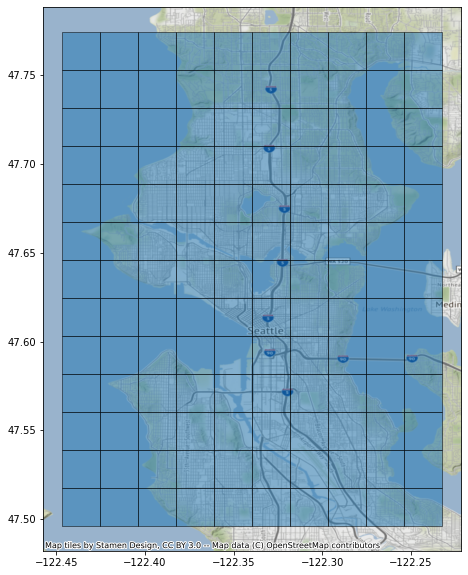

[[-122.36385642 -122.28875539 -122.32570899 -122.32198852 -122.35682434]
 [  47.6625306    47.54521575   47.60978815   47.69885681   47.54972959]]


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4]
[]
[0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[]
[]
[]
[]
[4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,

[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 4, 4, -1, 0, 0, 0, -1, -1, -1, -1, 4, 4, 4, 4, 4, -1, 0, 0, 0, 0, -1, -1, -1, 4, 4, 4, 4, 4, 2, 0, 0, 0, 0, 3, 3, -1, 4, 4, 4, 4, 4, 2, 2, 0, 0, 3, 3, 3, -1, -1, 4, 4, 4, 2, 2, 2, 3, 3, 3, 3, 3, -1, -1, 1, 1, 1, 2, 2, 2, 3, 3, 3, 3, 3, -1, 1, 1, 1, 1, 2, 2, 2, 3, 3, 3, 3, 3, -1, 1, 1, 1, 1, -1, -1, -1, 3, 3, 3, -1, -1, -1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1]


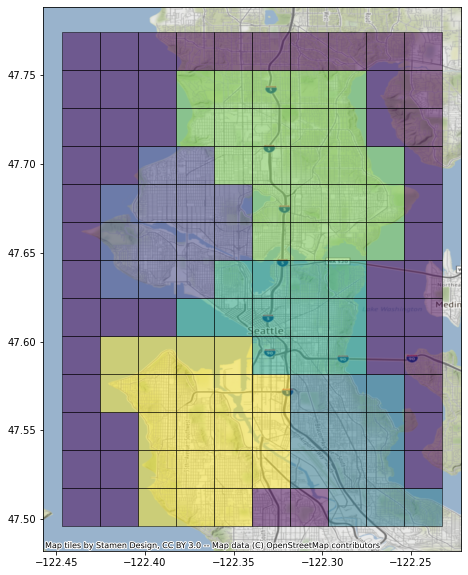

Total incidents:  20447
Total cells:  130
Total cells with incident:  80
Range of Data: January 1st, 2019 - Present


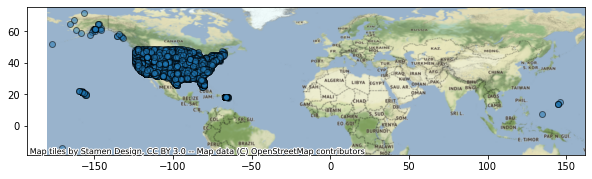

,OBJECTID,ID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,TELEPHONE,TYPE,...,WEBSITE,STATE_ID,ALT_NAME,ST_FIPS,OWNER,TTL_STAFF,BEDS,TRAUMA,HELIPAD,geometry
0,2,0053391362,LOS ROBLES HOSPITAL & MEDICAL CENTER - EAST CA...,150 VIA MERIDA,WESTLAKE VILAGE,CA,91362,NOT AVAILABLE,NOT AVAILABLE,GENERAL ACUTE CARE,...,http://www.losrobleshospital.com,NOT AVAILABLE,NOT AVAILABLE,06,PROPRIETARY,-999,40.0,NOT AVAILABLE,N,POINT (-118.81574 34.15494)
1,3,0011190023,EAST LOS ANGELES DOCTORS HOSPITAL,4060 WHITTIER BOULEVARD,LOS ANGELES,CA,90023,NOT AVAILABLE,NOT AVAILABLE,GENERAL ACUTE CARE,...,http://www.elalax.com,NOT AVAILABLE,NOT AVAILABLE,06,PROPRIETARY,-999,127.0,NOT AVAILABLE,N,POINT (-118.18416 34.02365)
2,4,0017090028,SOUTHERN CALIFORNIA HOSPITAL AT HOLLYWOOD,6245 DE LONGPRE AVENUE,HOLLYWOOD,CA,90028,NOT AVAILABLE,(323) 462-2271,GENERAL ACUTE CARE,...,http://sch-hollywood.com/,NOT AVAILABLE,HOLLYWOOD COMMUNITY HOSPITAL OF HOLLYWOOD,06,PROPRIETARY,-999,100.0,NOT AVAILABLE,N,POINT (-118.32523 34.09639)
3,5,0023691706,KINDRED HOSPITAL BALDWIN PARK,14148 FRANCISQUITO AVENUE,BALDWIN PARK,CA,91706,NOT AVAILABLE,NOT AVAILABLE,GENERAL ACUTE CARE,...,http://www.khbaldwinpark.com,NOT AVAILABLE,NOT AVAILABLE,06,PROPRIETARY,-999,95.0,NOT AVAILABLE,N,POINT (-117.96744 34.06304)
4,6,0025190712,LAKEWOOD REGIONAL MEDICAL CENTER,3700 EAST SOUTH STREET,LAKEWOOD,CA,90712,NOT AVAILABLE,NOT AVAILABLE,GENERAL ACUTE CARE,...,http://www.lakewoodregional.com,NOT AVAILABLE,NOT AVAILABLE,06,PROPRIETARY,-999,172.0,NOT AVAILABLE,N,POINT (-118.14840 33.85971)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7618,7825,0196784304,SUN BEHAVIORAL DELAWARE LLC,21655 BIDEN AVE,GEORGETOWN,DE,19947,NOT AVAILABLE,NOT AVAILABLE,REHABILITATION,...,NOT AVAILABLE,NOT AVAILABLE,NOT AVAILABLE,10,NOT AVAILABLE,-999,-999.0,NOT AVAILABLE,N,POINT (-75.40742 38.69909)
7619,7826,0196784305,TEXAS HEALTH NEIGHBORHOOD CARE & WELLNESS WILL...,101 CROWN POINTE BLVD,WILLOW PARK,TX,76087,NOT AVAILABLE,NOT AVAILABLE,GENERAL ACUTE CARE,...,NOT AVAILABLE,NOT AVAILABLE,NOT AVAILABLE,48,NOT AVAILABLE,-999,-999.0,NOT AVAILABLE,Y,POINT (-97.66231 32.74480)
7620,7827,0196784306,WEED ARMY COMMUNITY HOSPITAL,N LOOP RD,FORT IRWIN,CA,92310,NOT AVAILABLE,NOT AVAILABLE,MILITARY,...,NOT AVAILABLE,NOT AVAILABLE,NOT AVAILABLE,06,GOVERNMENT - FEDERAL,-999,-999.0,NOT AVAILABLE,Y,POINT (-116.68209 35.27259)
7621,7828,0196784307,WISE REGIONAL HEALTH SYSTEM,2000 FM 51,DECATUR,TX,76234,NOT AVAILABLE,NOT AVAILABLE,GENERAL ACUTE CARE,...,NOT AVAILABLE,NOT AVAILABLE,NOT AVAILABLE,48,NOT AVAILABLE,-999,-999.0,NOT AVAILABLE,Y,POINT (-97.59761 33.21788)


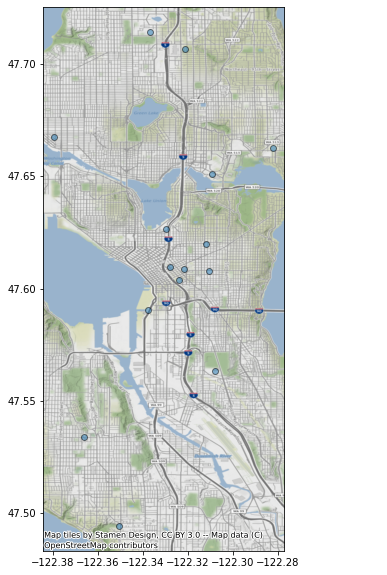

[[-122.36617183   47.53407121]
 [-122.31205809   47.61998188]
 [-122.32114259   47.70662682]
 [-122.350699     47.49433229]
 [-122.32973573   47.62645489]
 [-122.37954969   47.66737354]
 [-122.31059794   47.60772122]
 [-122.32162109   47.60866127]
 [-122.337913     47.59024221]
 [-122.30926063   47.65085814]
 [-122.33689538   47.71417239]
 [-122.30802566   47.56323103]
 [-122.3278668    47.60977668]
 [-122.32398892   47.60386015]
 [-122.28208299   47.66256824]]


In [15]:
with open("/Users/hunter7lee/Downloads/cluster_output_5_r.pk", 'rb') as handle:
    b5 = pickle.load(handle) 

/Users/hunter7lee/opt/anaconda3/envs/ox/lib/python3.10/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator KMeans from version 0.23.2 when using version 1.1.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [16]:
b5

({'0': 5,
  '1': 5,
  '2': 5,
  '3': 5,
  '4': 5,
  '5': 5,
  '6': 5,
  '7': 5,
  '8': 5,
  '9': 5,
  '10': 5,
  '11': 5,
  '12': 5,
  '13': 5,
  '14': 5,
  '15': 5,
  '16': 5,
  '17': 5,
  '18': 5,
  '19': 5,
  '20': 5,
  '21': 5,
  '22': 5,
  '23': 0,
  '24': 0,
  '25': 5,
  '26': 5,
  '27': 5,
  '28': 5,
  '29': 5,
  '30': 5,
  '31': 5,
  '32': 5,
  '33': 5,
  '34': 5,
  '35': 5,
  '36': 5,
  '37': 5,
  '38': 5,
  '39': 5,
  '40': 5,
  '41': 5,
  '42': 5,
  '43': 5,
  '44': 5,
  '45': 5,
  '46': 5,
  '47': 5,
  '48': 5,
  '49': 5,
  '50': 5,
  '51': 0,
  '52': 0,
  '53': 0,
  '54': 0,
  '55': 5,
  '56': 5,
  '57': 5,
  '58': 5,
  '59': 5,
  '60': 5,
  '61': 2,
  '62': 5,
  '63': 5,
  '64': 5,
  '65': 5,
  '66': 5,
  '67': 5,
  '68': 5,
  '69': 5,
  '70': 5,
  '71': 5,
  '72': 5,
  '73': 5,
  '74': 5,
  '75': 5,
  '76': 5,
  '77': 5,
  '78': 5,
  '79': 5,
  '80': 0,
  '81': 0,
  '82': 0,
  '83': 0,
  '84': 0,
  '85': 5,
  '86': 5,
  '87': 5,
  '88': 5,
  '89': 5,
  '90': 2,
  '91': 2

In [19]:
print(b5[1].type())

AttributeError: 'KMeans' object has no attribute 'type'

In [24]:
with open("/Users/hunter7lee/Desktop/ISIS/kMeansClusters.pkl", 'rb') as handle:
    b9 = pickle.load(handle) 

In [25]:
b9

({0: -1,
  1: -1,
  2: -1,
  3: -1,
  4: -1,
  5: -1,
  6: -1,
  7: -1,
  8: -1,
  9: -1,
  10: -1,
  11: -1,
  12: -1,
  13: -1,
  14: -1,
  15: -1,
  16: 4,
  17: 4,
  18: -1,
  19: 5,
  20: 5,
  21: 5,
  22: -1,
  23: -1,
  24: -1,
  25: -1,
  26: 4,
  27: 4,
  28: 4,
  29: 4,
  30: 4,
  31: -1,
  32: 5,
  33: 5,
  34: 5,
  35: 5,
  36: -1,
  37: -1,
  38: -1,
  39: 4,
  40: 4,
  41: 4,
  42: 4,
  43: 4,
  44: 3,
  45: 5,
  46: 5,
  47: 5,
  48: 5,
  49: 2,
  50: 2,
  51: -1,
  52: 6,
  53: 6,
  54: 6,
  55: 4,
  56: 3,
  57: 3,
  58: 3,
  59: 5,
  60: 5,
  61: 2,
  62: 2,
  63: 2,
  64: -1,
  65: -1,
  66: 6,
  67: 6,
  68: 6,
  69: 3,
  70: 3,
  71: 3,
  72: 1,
  73: 1,
  74: 2,
  75: 2,
  76: 2,
  77: -1,
  78: -1,
  79: 6,
  80: 0,
  81: 6,
  82: 3,
  83: 3,
  84: 1,
  85: 1,
  86: 1,
  87: 2,
  88: 2,
  89: 2,
  90: -1,
  91: 0,
  92: 0,
  93: 0,
  94: 0,
  95: 3,
  96: 3,
  97: 1,
  98: 1,
  99: 1,
  100: 1,
  101: 2,
  102: 2,
  103: -1,
  104: 0,
  105: 0,
  106: 0,
  107: 0